In [1]:

import torch
import torch.nn as nn
import numpy as np
import pandas as pd

from torch.utils.data import Dataset

import pandas, random, numpy
import matplotlib.pyplot as plt

from PIL import Image, ImageOps


import glob
import PIL

from sklearn.model_selection import train_test_split


In [2]:

civs_path = 'data/imgs.new.CIVS'


In [3]:

path  = civs_path

paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names

n_images = len(paths)

rand_idxs = np.random.permutation(n_images)

paths_subset = np.random.choice(paths, n_images , replace=False) 
all_paths    = paths_subset[rand_idxs]

print(n_images)


5016


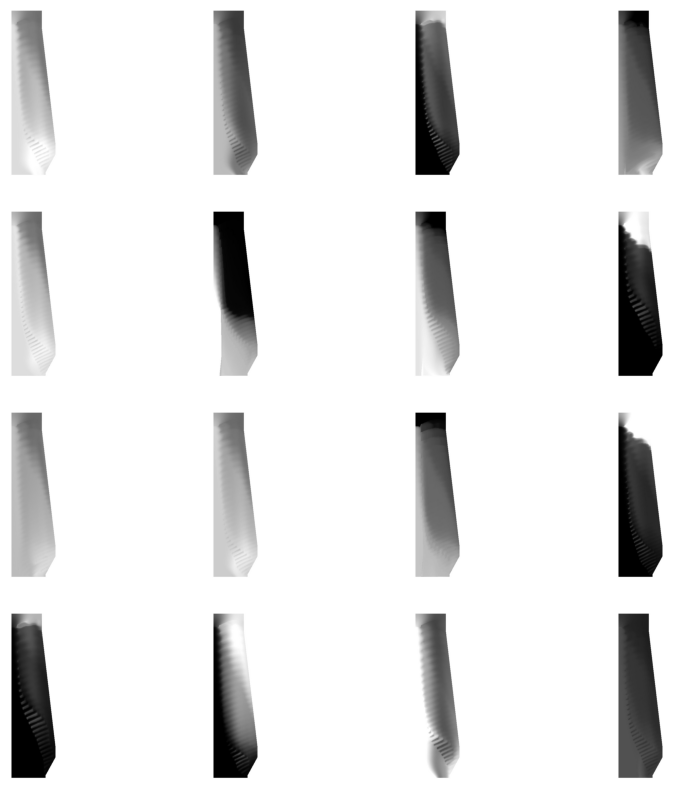

In [4]:

_, axes = plt.subplots(4, 4, figsize=(10, 10))

for ax, img_path in zip(axes.flatten(), all_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")


In [5]:

## data/imgs.new.CIVS/h2_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow3.0_Hbt1410_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2o_Ng0_Pci150_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2_Ng40_Pci60_H0_Wp0_Ph300_Ox23_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg

    
## ['tg', 'Ng0', 'Pci175', 'H0', 'Wp0', 'Ph300', 'Ox24', 'Ow7', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
    


In [6]:

'''

['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']
['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']


'''


"\n\n['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']\n['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n\n\n"

In [7]:

def label_func2(fname):
    ## print(fname)
    fname = fname.replace("data/imgs.new.CIVS/","")
    temp_name = fname.replace(".jpg", "").split("_")
    ## print(temp_name)
    
  
    y0 = temp_name[0]                              ## tg
    y1 = float(temp_name[1].replace("Ng", ""))     ## 'Ng0'
    y2 = float(temp_name[2].replace("Pci", ""))    ## 'Pci175'
    y3 = float(temp_name[3].replace("H", ""))     ## 'H0'
    y4 = float(temp_name[4].replace("Wp", ""))     ## 'Wp0'
    y5 = float(temp_name[5].replace("Ph", ""))     ## 'Ph300'
    y6 = float(temp_name[6].replace("Ox", ""))    ## 'Ox24'
    y7 = float(temp_name[7].replace("Ow", ""))     ## 'Ow7
    y8 = float(temp_name[8].replace("Hbt", ""))    ## 'Hbt1459.8'
    y9 = float(temp_name[9].replace("Wm", ""))    ## 'Wm12.2'
    y10 = float(temp_name[10].replace("Wr", ""))    ## 'Wr308750.4'
    
 
    ## np.array([y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ])
    return [fname, y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ]


In [8]:

## 1400, 390
## x 0.2
## 280 , 78
## 140, 39   ## for web tool
## 1400, 390  * 0.4 = 560, 156


list_imgs = []
list_label_vectors = []

for img_name in all_paths:
    ##print(img_name)
    
    my_img = Image.open(img_name)
    
    my_img = my_img.resize((39, 140))

    my_img = ImageOps.grayscale(my_img)

    img_np = np.array(my_img)
    
    ## data = np.array(my_img)
    ## print(data)
    ## input()

    ## img_np = img_np.reshape(-1)
    
    temp_label_vector_rc = label_func2(img_name)
    if temp_label_vector_rc[1] == "tg":
    
        ## print(img_np.shape)
        list_imgs.append(img_np)

        list_label_vectors.append( temp_label_vector_rc )


In [9]:

X =  list_imgs
y =  list_label_vectors 


In [10]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

#######################################################

print(len(X_train))
print(len(X_test))
print(len(y_train))
print(len(y_test))


668
168
668
168


In [11]:

X_train[0]


array([[255, 255, 255, ..., 255, 255, 255],
       [254, 166, 132, ..., 255, 255, 255],
       [255, 107,  47, ..., 255, 255, 255],
       ...,
       [255, 188, 162, ..., 255, 255, 255],
       [255, 243, 238, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [12]:

list_ids_train      = []
list_features_train = []
list_imgs_train     = []


for index in range(len(X_train)):
    
    # image target (label)
    reg_vals = y_train[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_train[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
    

        
    list_ids_train.append(          reg_vals[0]                )
    list_imgs_train.append(        single_np_img               )
    list_features_train.append(    target      )


In [13]:

list_imgs_train[0]


array([[255, 255, 255, ..., 255, 255, 255],
       [254, 166, 132, ..., 255, 255, 255],
       [255, 107,  47, ..., 255, 255, 255],
       ...,
       [255, 188, 162, ..., 255, 255, 255],
       [255, 243, 238, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [14]:

list_ids_test      = []
list_features_test = []
list_imgs_test     = []


for index in range(len(X_test)):
    
    # image target (label)
    reg_vals = y_test[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_test[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
        
    list_ids_test.append(          reg_vals[0]                )
    list_imgs_test.append(        single_np_img               )
    list_features_test.append(    target      )


In [15]:

conditions_matrix_train = np.array( list_features_train )
conditions_matrix_test  = np.array( list_features_test )


In [16]:

print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )


(668, 10)
(168, 10)



## Save data for deployment


In [17]:

DF_conditions_train = pd.DataFrame(conditions_matrix_train)
DF_conditions_train.to_csv("PD_conditions_train.csv")


In [18]:

DF_ids_train = pd.DataFrame(list_ids_train)
DF_ids_train.to_csv("PD_ids_train.csv")


In [19]:

list_imgs_train[17]


array([[255, 255, 255, ..., 255, 255, 255],
       [254, 166, 132, ..., 255, 255, 255],
       [255, 107,  46, ..., 255, 255, 255],
       ...,
       [255, 189, 162, ..., 255, 255, 255],
       [255, 242, 238, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [20]:

list_imgs_train[17].shape


(140, 39)

In [21]:

list_imgs_train_stretched = [     the_img_np.reshape(-1)         for the_img_np in list_imgs_train ]


In [22]:

list_imgs_train_stretched[0]


array([255, 255, 255, ..., 255, 255, 255], dtype=uint8)

In [23]:

list_imgs_train_stretched[4].shape


(5460,)

In [24]:

list_imgs_train_stretched[4][:1000]


array([255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 169, 135, 138, 135, 132, 127, 123, 118, 113, 109, 105, 102,
       100,  99,  99,  99,  99,  99,  99,  99,  99,  99,  99,  99,  99,
       188, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 111,  53,  56,  52,  47,  39,  31,  22,  16,   8,   2,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
       143, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 117,  62,  65,  62,  56,  49,  40,  31,  24,  16,  10,   5,
         1,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
       147, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 119,  65,  67,  63,  58,  51,  40,  31,  22,  15,   9,   4,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   

In [25]:

list_imgs_train_stretched[7].shape


(5460,)


## Keeps scale at 0..255


In [26]:

np_list_imgs_train_stretched = np.array( list_imgs_train_stretched )  


In [27]:

np_list_imgs_train_stretched.shape


(668, 5460)

In [28]:

np_list_imgs_train_stretched[3]


array([254, 255, 255, ..., 255, 255, 255], dtype=uint8)

In [29]:

DF_imgs_np_train = pd.DataFrame(np_list_imgs_train_stretched)


In [30]:

DF_imgs_np_train


,0,1,2,3,4,5,6,7,8,9,...,5450,5451,5452,5453,5454,5455,5456,5457,5458,5459
0,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
1,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
2,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
3,254,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
4,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
663,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
664,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
665,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
666,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255


In [31]:

DF_imgs_np_train.to_csv("PD_imgs_np_train.csv")



## Follow Web tool logic


In [32]:


url1 = "PD_ids_train.csv"
pd_ids_train = pd.read_csv(url1)
pd_ids_train_np = pd_ids_train.to_numpy()
pd_ids_train_np = pd_ids_train_np[1:, 1:]


In [33]:

url2 = "PD_conditions_train.csv"
pd_conditions_train = pd.read_csv(url2)
pd_conditions_train_np = pd_conditions_train.to_numpy()
pd_conditions_train_np   = pd_conditions_train_np[1:, 1:]


In [34]:


url3 = "PD_imgs_np_train.csv"
pd_imgs_np_train = pd.read_csv(url3)
pd_imgs_np_train_np = pd_imgs_np_train.to_numpy()
pd_imgs_np_train_np      = pd_imgs_np_train_np[1:, 1:]




## KNN part


In [35]:

def euclidean_distance(v1, v2):
    return np.sqrt( np.sum(   (v1 - v2)**2   )   )



In [36]:

def predict(test_x):
    
    ## calculate distances between test_x and all dta samples in x
    ## this distances vector is a vector of 45 distances
    ## distances = [ euclidean_distance(test_x , x)  for x in X_train    ]

    distances = [ euclidean_distance(test_x, x )  for x in pd_conditions_train_np  ]
      
    
    ## distances - > [23, 3, 145, 17, ...]
    
    k = 3
    
    ## sort by distance value and return the k nearest neighbors
    ## np.argsort returns the indices of the k neares neighbors
    k_neighbor_indices = np.argsort(distances)[:k]
    print(k_neighbor_indices)
    
    
    ## with indices, extract labels from y_train 
    selected_imgs_to_avg = [ pd_imgs_np_train_np[i].reshape((140, 39))  for i in k_neighbor_indices  ]
    

    return selected_imgs_to_avg


In [37]:

np.set_printoptions(suppress=True)
print( conditions_matrix_test[:10, :] )


[[   120.       0.       0.       0.     300.      30.       5.    1410.
      12.2 308750.4]
 [   120.       0.       0.       0.     300.      24.       4.    1410.
      12.2 308750.4]
 [    37.9      0.       0.       0.     400.      27.       8.    1459.8
      12.2 308750.4]
 [     0.      90.       0.       0.     300.      24.       4.    1459.8
      12.2 308750.4]
 [    90.       0.       0.       0.     300.      30.       3.    1459.8
      12.2 308750.4]
 [    70.       0.       0.       0.     500.      30.       9.    1459.8
      12.2 308750.4]
 [   150.       0.       0.       0.     300.      30.       9.    1410.
      12.2 308750.4]
 [    37.9      0.       0.       0.     300.      24.       9.    1459.8
      12.2 308750.4]
 [    40.      10.       0.       0.     300.      21.       9.    1459.8
      12.2 308750.4]
 [     0.     175.       0.       0.     300.      30.       6.    1459.8
      12.2 308750.4]]


In [38]:

def generate_img_per_index(index):
    
    selected_imgs_to_avg = predict( conditions_matrix_test[  index  ] )
    the_test_conditions = conditions_matrix_test[  index  ]
    
    
    avg_gen_img = np.mean( np.array(selected_imgs_to_avg), axis=0 )
    avg_gen_img = avg_gen_img.astype(int)
    gen_pil_image = avg_gen_img
    
    real_my_img = np.array(list_imgs_test[index])
    real_pil_image = Image.fromarray(real_my_img)
    real_pil_image = ImageOps.grayscale(real_pil_image)
    
    print(gen_pil_image)
    print(real_pil_image)
    
    return the_test_conditions, gen_pil_image, real_pil_image


[ 83 256 400]
[[254 255 255 ... 255 255 255]
 [254 157 119 ... 255 255 255]
 [255  91  25 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB87332D810>


Text(0.5, 1.0, 'real')

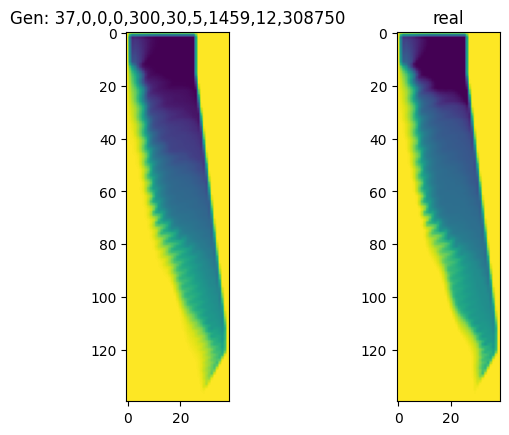

In [39]:

the_test_conditions, gen_pil_image, real_pil_image = generate_img_per_index(17)


the_test_conditions = the_test_conditions.astype(int)
str_conditions = np.array2string(the_test_conditions, precision=0, separator=',', suppress_small=True)
str_conditions = str_conditions.replace(" ","")
str_conditions = str_conditions.replace("[","")
str_conditions = str_conditions.replace("]","")

## print(str_conditions)
                 

fig, ax = plt.subplots(1,2)

ax[0].imshow(gen_pil_image)
ax[1].imshow(real_pil_image)

ax[0].set_title("Gen: " + str_conditions)
ax[1].set_title("real")


[430  94 637]
[[255 255 255 ... 255 255 255]
 [255 172 139 ... 255 255 255]
 [255 116  60 ... 255 255 255]
 ...
 [255 214 197 ... 255 255 255]
 [255 248 245 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB830E21610>
[246  17 201]
[[255 255 255 ... 255 255 255]
 [255 172 140 ... 255 255 255]
 [255 117  61 ... 255 255 255]
 ...
 [255 200 179 ... 255 255 255]
 [255 244 241 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB87359DC10>
[310 577 140]
[[254 255 255 ... 255 255 255]
 [254 156 117 ... 255 255 255]
 [255  90  23 ... 255 255 255]
 ...
 [255 243 239 ... 255 255 255]
 [255 253 252 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB865284C50>
[ 51 323 192]
[[255 255 255 ... 255 255 255]
 [254 169 136 ... 255 255 255]
 [255 112  54 ... 255 255 255]
 ...
 [255 237 231 ... 255 255 255]
 [255 252 251 ... 255 255 255]
 [255 255 255 ... 255 255

/Users/user/opt/anaconda3/envs/py37_new_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[460 662 546]
[[254 255 255 ... 255 255 255]
 [254 162 126 ... 255 255 255]
 [255 100  38 ... 255 255 255]
 ...
 [255 249 247 ... 255 255 255]
 [255 254 253 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB8669713D0>
[253  26  73]
[[255 255 255 ... 255 255 255]
 [254 166 132 ... 255 255 255]
 [255 107  48 ... 255 255 255]
 ...
 [255 220 207 ... 255 255 255]
 [255 248 246 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB872AE6B50>
[517  28 286]
[[255 255 255 ... 255 255 255]
 [254 168 134 ... 255 255 255]
 [255 110  51 ... 255 255 255]
 ...
 [255 230 221 ... 255 255 255]
 [255 250 249 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB8735391D0>
[201 322 246]
[[255 255 255 ... 255 255 255]
 [255 171 138 ... 255 255 255]
 [255 115  58 ... 255 255 255]
 ...
 [255 200 179 ... 255 255 255]
 [255 244 241 ... 255 255 255]
 [255 255 255 ... 255 255

[496 418 332]
[[255 255 255 ... 255 255 255]
 [254 169 136 ... 255 255 255]
 [255 113  55 ... 255 255 255]
 ...
 [255 242 236 ... 255 255 255]
 [255 253 252 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB867347E10>
[502 450 666]
[[255 255 255 ... 255 255 255]
 [254 164 129 ... 255 255 255]
 [255 103  42 ... 255 255 255]
 ...
 [255 217 201 ... 255 255 255]
 [255 248 246 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB881A10CD0>
[113 316 446]
[[255 255 255 ... 255 255 255]
 [255 174 143 ... 255 255 255]
 [255 120  66 ... 255 255 255]
 ...
 [255 225 214 ... 255 255 255]
 [255 249 247 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB8209D1F10>
[469 626 286]
[[254 255 255 ... 255 255 255]
 [254 162 126 ... 255 255 255]
 [255 100  37 ... 255 255 255]
 ...
 [255 236 228 ... 255 255 255]
 [255 251 251 ... 255 255 255]
 [255 255 255 ... 255 255

[ 35 302 505]
[[255 255 255 ... 255 255 255]
 [254 166 132 ... 255 255 255]
 [255 107  47 ... 255 255 255]
 ...
 [255 240 233 ... 255 255 255]
 [255 252 251 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB867E9AC10>
[ 63 649 503]
[[255 255 255 ... 255 255 255]
 [255 170 137 ... 255 255 255]
 [255 113  56 ... 255 255 255]
 ...
 [255 207 188 ... 255 255 255]
 [255 246 242 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB8825C5B90>
[278 149 633]
[[255 255 255 ... 255 255 255]
 [254 169 136 ... 255 255 255]
 [255 111  54 ... 255 255 255]
 ...
 [255 225 214 ... 255 255 255]
 [255 249 247 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB820C68ED0>
[518 600 584]
[[255 255 255 ... 255 255 255]
 [254 165 130 ... 255 255 255]
 [255 105  44 ... 255 255 255]
 ...
 [255 237 231 ... 255 255 255]
 [255 252 251 ... 255 255 255]
 [255 255 255 ... 255 255

[596 618 462]
[[255 255 255 ... 255 255 255]
 [255 170 138 ... 255 255 255]
 [255 114  57 ... 255 255 255]
 ...
 [255 214 199 ... 255 255 255]
 [255 247 244 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB82129FF10>
[148 237 105]
[[255 255 255 ... 255 255 255]
 [254 172 139 ... 255 255 255]
 [255 116  60 ... 255 255 255]
 ...
 [255 215 200 ... 255 255 255]
 [255 247 245 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB873E90250>
[404 262 409]
[[254 255 255 ... 255 255 255]
 [254 152 112 ... 255 255 255]
 [255  83  14 ... 255 255 255]
 ...
 [255 237 230 ... 255 255 255]
 [255 252 251 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
<PIL.Image.Image image mode=L size=39x140 at 0x7FB873EEA510>
[274 279 159]
[[255 255 255 ... 255 255 255]
 [254 167 134 ... 255 255 255]
 [255 109  50 ... 255 255 255]
 ...
 [255 233 224 ... 255 255 255]
 [255 251 249 ... 255 255 255]
 [255 255 255 ... 255 255

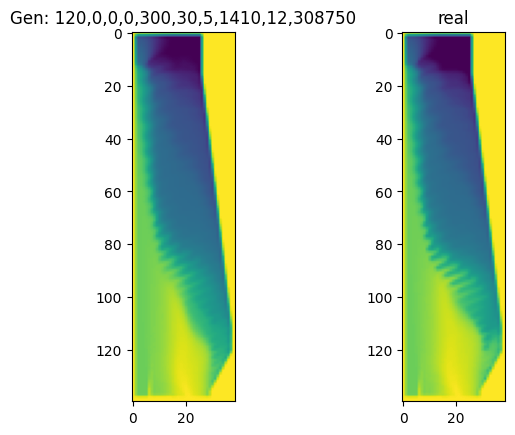

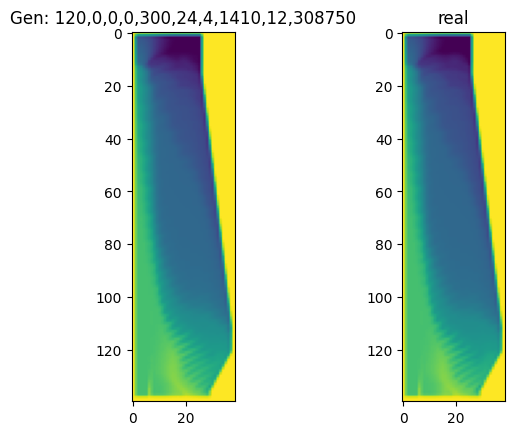

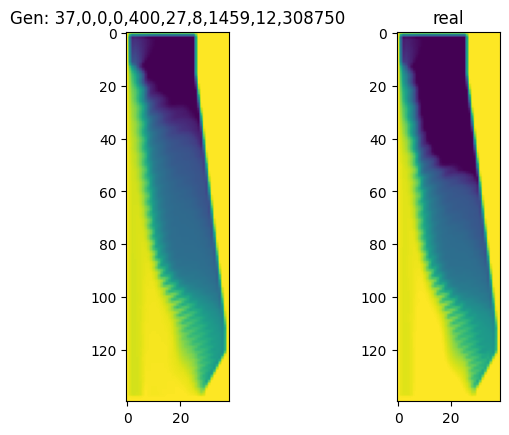

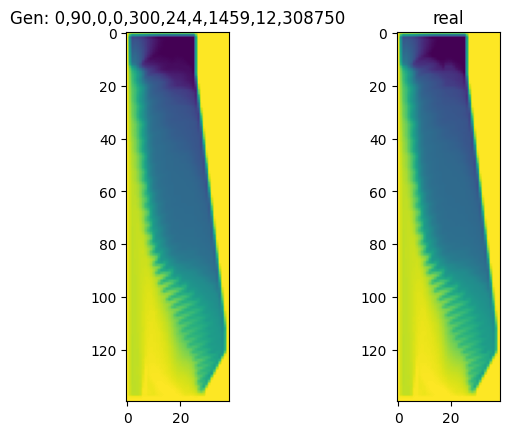

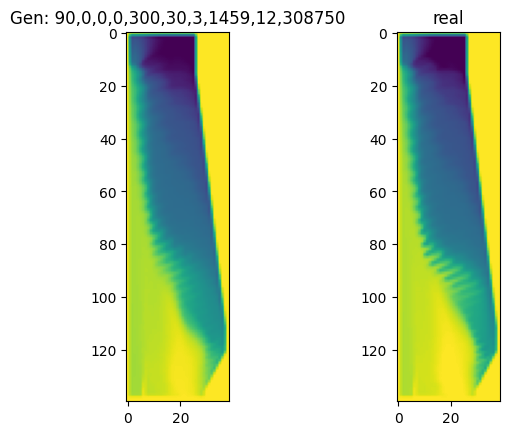

...

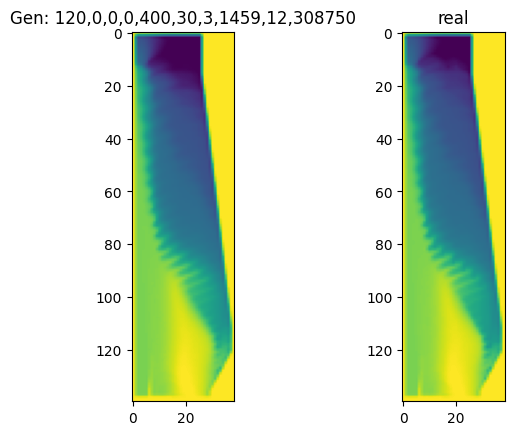

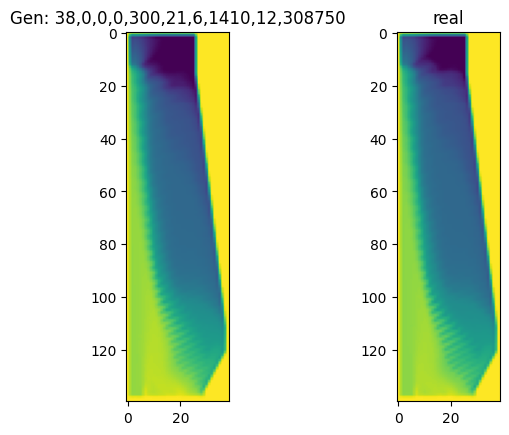

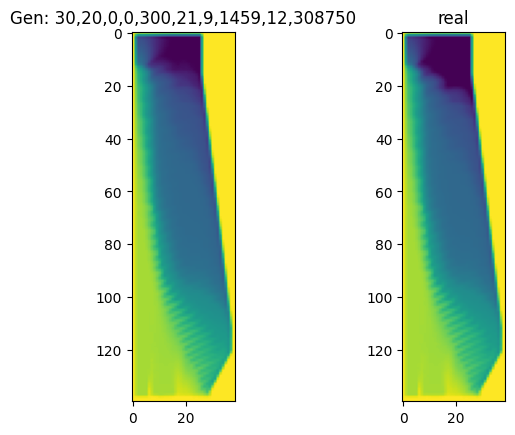

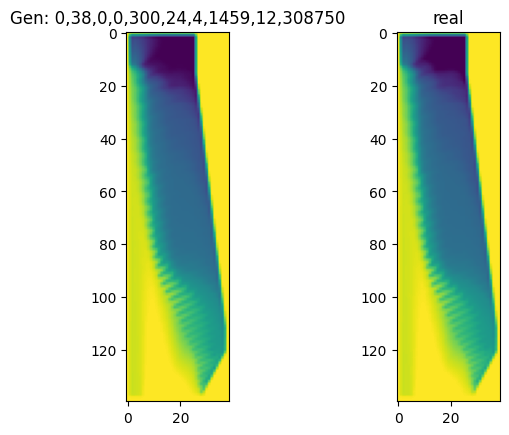

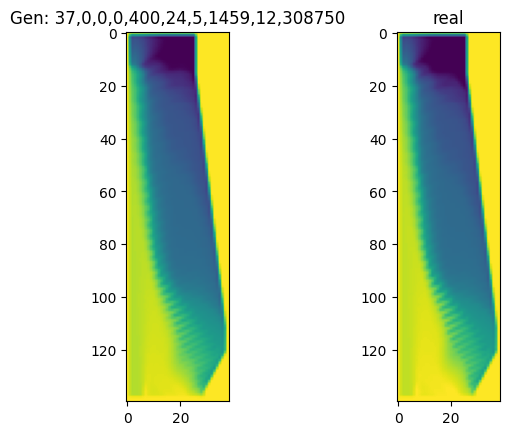

In [40]:

for test_i in range( conditions_matrix_test.shape[0]  ):


    the_test_conditions, gen_pil_image, real_pil_image = generate_img_per_index(test_i)
    
    the_test_conditions = the_test_conditions.astype(int)
    str_conditions = np.array2string(the_test_conditions, precision=0, separator=',', suppress_small=True)
    str_conditions = str_conditions.replace(" ","")
    str_conditions = str_conditions.replace("[","")
    str_conditions = str_conditions.replace("]","")

    ## print(str_conditions)

    fig, ax = plt.subplots(1,2)
    ax[0].imshow(gen_pil_image)
    ax[1].imshow(real_pil_image)
    
    ax[0].set_title("Gen: " + str_conditions)
    ax[1].set_title("real")
